In [1]:
# install dependencies and download dataset
!git clone https://github.com/bowang-lab/MedSAM2.git
%cd MedSAM2
%pip install -e .
# download checkpoints
!mkdir -p checkpoints
!wget -P checkpoints https://huggingface.co/wanglab/MedSAM2/resolve/main/MedSAM2_2411.pt

Cloning into 'MedSAM2'...
remote: Enumerating objects: 297, done.
remote: Counting objects: 100% (98/98), done.
remote: Compressing objects: 100% (57/57), done.
remote: Total 297 (delta 61), reused 42 (delta 41), pack-reused 199 (from 1)
Receiving objects: 100% (297/297), 18.83 MiB | 18.68 MiB/s, done.
Resolving deltas: 100% (120/120), done.
/content/MedSAM2
Obtaining file:///content/MedSAM2
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 2.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 9.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.6/52.6 MB 39.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [2]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


# Jupyter Notebook Demo of CT Lesion annotation

This notebook provides a demo of CT lesion annotation using MedSAM2. Please install MedSAM2 and download the model weights before running the notebook. This notebook uses the box prompt on the key slices to segment the 3D CT lesion case.

In [3]:
# load libraries and define necessary functions
from glob import glob
from tqdm import tqdm
import os
from os.path import join, basename
import re
import matplotlib.pyplot as plt
from collections import OrderedDict
import pandas as pd
import numpy as np
import argparse

from PIL import Image
import SimpleITK as sitk
import torch
import torch.multiprocessing as mp
from sam2.build_sam import build_sam2_video_predictor_npz
import SimpleITK as sitk
from skimage import measure, morphology

torch.set_float32_matmul_precision('high')
torch.manual_seed(2024)
torch.cuda.manual_seed(2024)
np.random.seed(2024)


def getLargestCC(segmentation):
    labels = measure.label(segmentation)
    largestCC = labels == np.argmax(np.bincount(labels.flat)[1:])+1
    return largestCC

def show_mask(mask, ax, mask_color=None, alpha=0.5):
    """
    show mask on the image

    Parameters
    ----------
    mask : numpy.ndarray
        mask of the image
    ax : matplotlib.axes.Axes
        axes to plot the mask
    mask_color : numpy.ndarray
        color of the mask
    alpha : float
        transparency of the mask
    """
    if mask_color is not None:
        color = np.concatenate([mask_color, np.array([alpha])], axis=0)
    else:
        color = np.array([251/255, 252/255, 30/255, alpha])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)


def show_box(box, ax, edgecolor='blue'):
    """
    show bounding box on the image

    Parameters
    ----------
    box : numpy.ndarray
        bounding box coordinates in the original image
    ax : matplotlib.axes.Axes
        axes to plot the bounding box
    edgecolor : str
        color of the bounding box
    """
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor=edgecolor, facecolor=(0,0,0,0), lw=2))


def resize_grayscale_to_rgb_and_resize(array, image_size):
    """
    Resize a 3D grayscale NumPy array to an RGB image and then resize it.

    Parameters:
        array (np.ndarray): Input array of shape (d, h, w).
        image_size (int): Desired size for the width and height.

    Returns:
        np.ndarray: Resized array of shape (d, 3, image_size, image_size).
    """
    d, h, w = array.shape
    resized_array = np.zeros((d, 3, image_size, image_size))

    for i in range(d):
        img_pil = Image.fromarray(array[i].astype(np.uint8))
        img_rgb = img_pil.convert("RGB")
        img_resized = img_rgb.resize((image_size, image_size))
        img_array = np.array(img_resized).transpose(2, 0, 1)  # (3, image_size, image_size)
        resized_array[i] = img_array

    return resized_array


Please specify the following:

- `checkpoint`: model checkpoint  
- `imgs_path`: path to the 3D volume in `nii.gz` format  
- `model_cfg`: model config path  
- `pred_save_dir`: path to save the inference results  
- `path_DL_info`: path to the CT lesion key slices info  

In [13]:
# Set paths to the model checkpoint, image directory, and dataset information of the bounding boxes
checkpoint = '/content/MedSAM2/checkpoints/MedSAM2_2411.pt'
imgs_path = '/content/drive/MyDrive/DLCS/DLCS dataset'
model_cfg = 'configs/sam2.1_hiera_t512.yaml'
pred_save_dir = "/content/drive/MyDrive/DLCS/MedSAM_results/"
os.makedirs("./MedSAM_results/", exist_ok=True)
path_DL_info = '/content/drive/MyDrive/DLCS/DLCSD24_Annotations.csv'
DL_info = pd.read_csv(path_DL_info)

For the purpose of the demo, we perform segmentation only on a single image in the `imgs_path`.

In [14]:
# Nii file name used for this demo
nii_fname = sorted(os.listdir(imgs_path))[0]

seg_info = OrderedDict()
seg_info['nii_name'] = []
seg_info['key_slice_index'] =[]
seg_info['DICOM_windows'] = []

In [15]:
seg_info = OrderedDict()
seg_info['nii_name'] = []

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
|------------------------------ No=1 ------------------------------|


Loading the Image:DLCS_1416.nii.gz
Number of Annotation:1
-----------------------------------------------------------------------------------------------
Annotation-ID =DLCS_1416_01
WorlCoord  CCC (x,y,x) =[ -85.19238281 -267.62988281 -275.73126221]
VoxelCoord CCC (x,y,y) =(159, 364, 280)
WorldCoord (w,h,d) =[4.04296875 4.04296875 4.0625    ]
VoxelCoord (w,h,d) =[5, 5, 6]


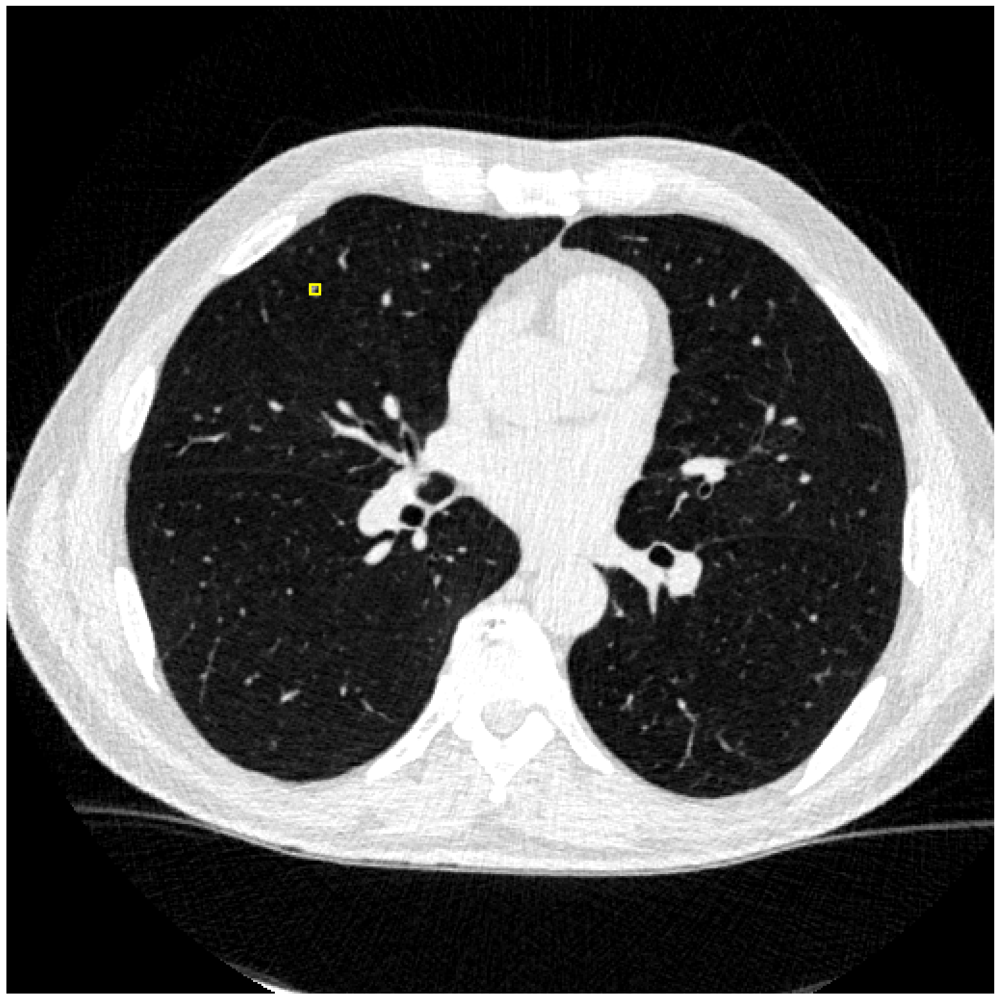

-----------------------------------------------------------------------------------------------


(578, 512, 512)


/content/MedSAM2/sam2/sam2_video_predictor_npz.py:965: UserWarning: /content/MedSAM2/sam2/_C.so: undefined symbol: _ZN3c106detail23torchInternalAssertFailEPKcS2_jS2_RKNSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEEE

Skipping the post-processing step due to the error above. You can still use SAM 2 and it's OK to ignore the error above, although some post-processing functionality may be limited (which doesn't affect the results in most cases; see https://github.com/facebookresearch/sam2/blob/main/INSTALL.md).
  pred_masks_gpu = fill_holes_in_mask_scores(
propagate in video: 100%|██████████| 578/578 [00:18<00:00, 31.46it/s]
propagate in video: 0it [00:00, ?it/s]



DLCS_1416_01
DLCS_1416_01_mask.nii.gz
|------------------------------ No=2 ------------------------------|


Loading the Image:DLCS_1417.nii.gz
Number of Annotation:1
-----------------------------------------------------------------------------------------------
Annotation-ID =DLCS_1417_01
WorlCoord  CCC (x,y,x) =[-102.19810486   62.00637817  -97.01312256]
VoxelCoord CCC (x,y,y) =(133, 195, 342)
WorldCoord (w,h,d) =[5.625      5.71289062 5.78125   ]
VoxelCoord (w,h,d) =[7, 7, 9]


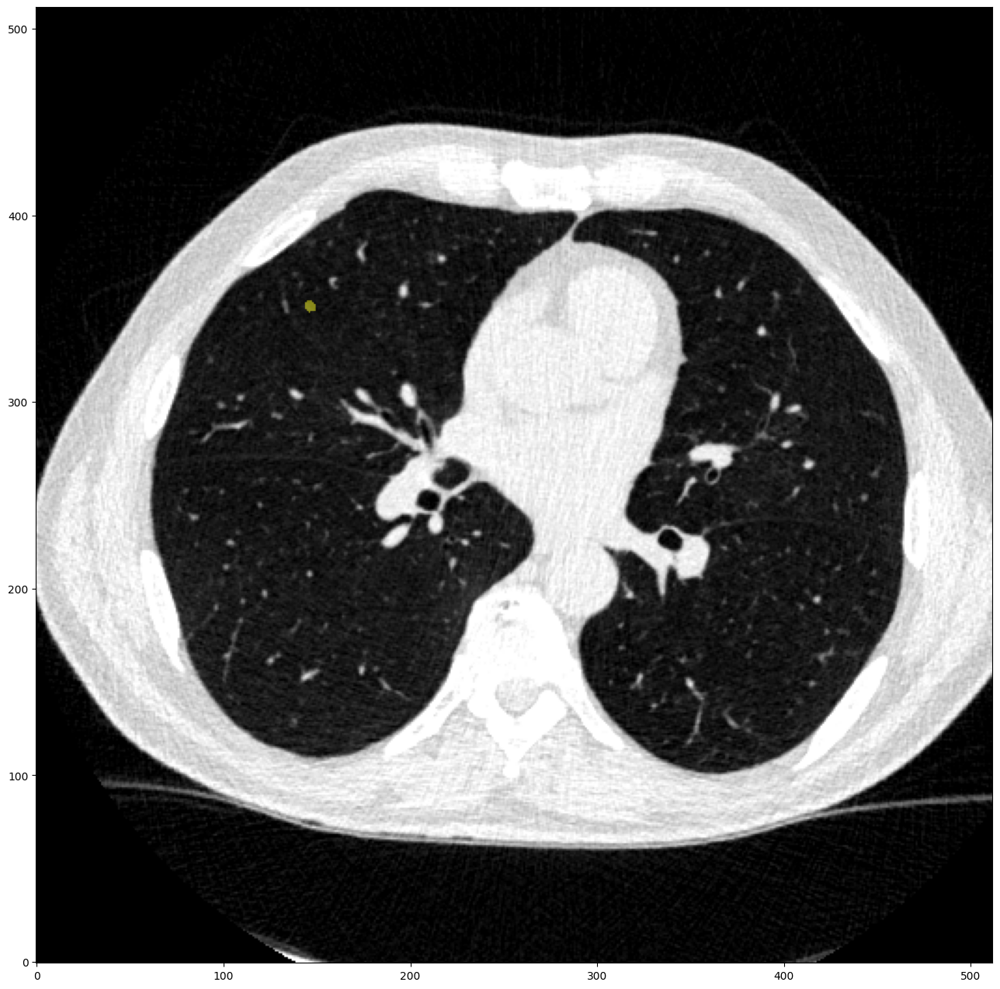

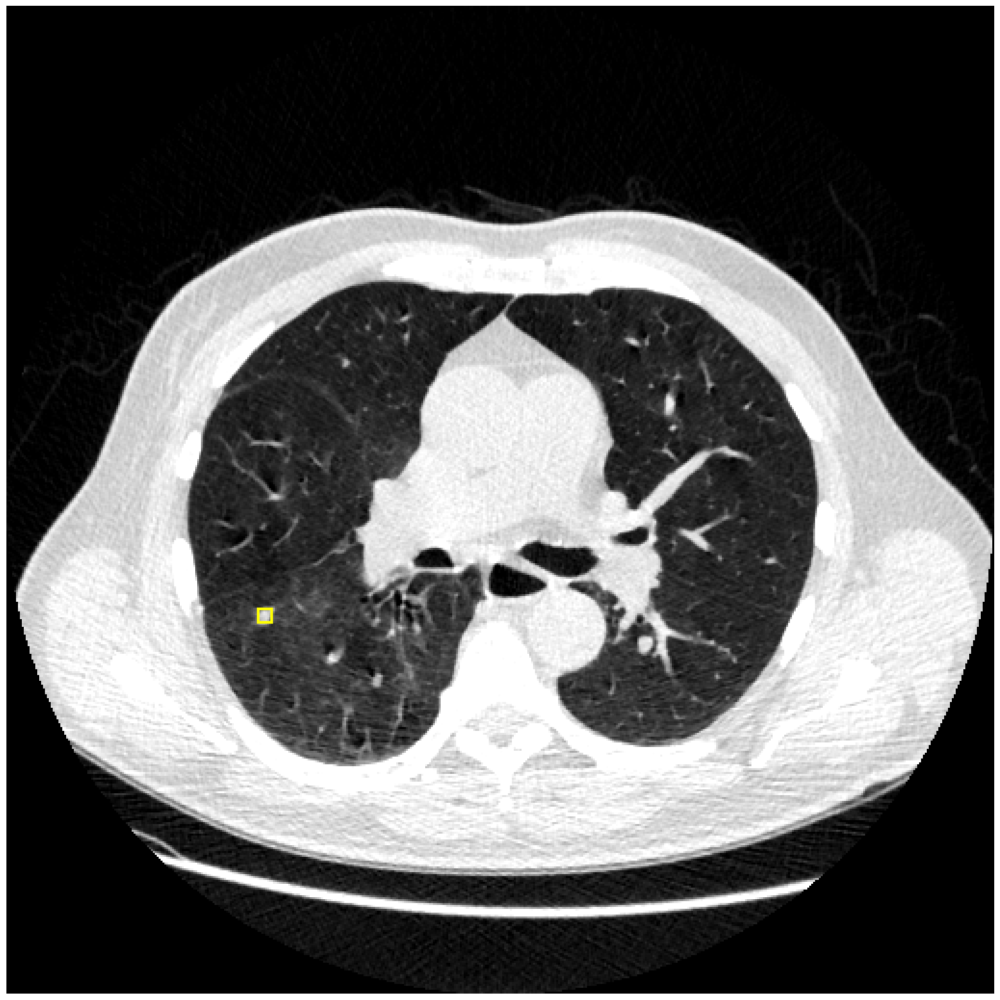

-----------------------------------------------------------------------------------------------


(552, 512, 512)


/content/MedSAM2/sam2/sam2_video_predictor_npz.py:965: UserWarning: /content/MedSAM2/sam2/_C.so: undefined symbol: _ZN3c106detail23torchInternalAssertFailEPKcS2_jS2_RKNSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEEE

Skipping the post-processing step due to the error above. You can still use SAM 2 and it's OK to ignore the error above, although some post-processing functionality may be limited (which doesn't affect the results in most cases; see https://github.com/facebookresearch/sam2/blob/main/INSTALL.md).
  pred_masks_gpu = fill_holes_in_mask_scores(
propagate in video: 100%|██████████| 552/552 [00:17<00:00, 31.49it/s]
propagate in video: 0it [00:00, ?it/s]



DLCS_1417_01
DLCS_1417_01_mask.nii.gz
|------------------------------ No=3 ------------------------------|


Loading the Image:DLCS_1418.nii.gz
Number of Annotation:2
-----------------------------------------------------------------------------------------------
Annotation-ID =DLCS_1418_01
WorlCoord  CCC (x,y,x) =[ -58.35742188 -149.03027344  -64.33123779]
VoxelCoord CCC (x,y,y) =(177, 213, 417)
WorldCoord (w,h,d) =[6.85546875 6.76757812 6.875     ]
VoxelCoord (w,h,d) =[8, 8, 11]


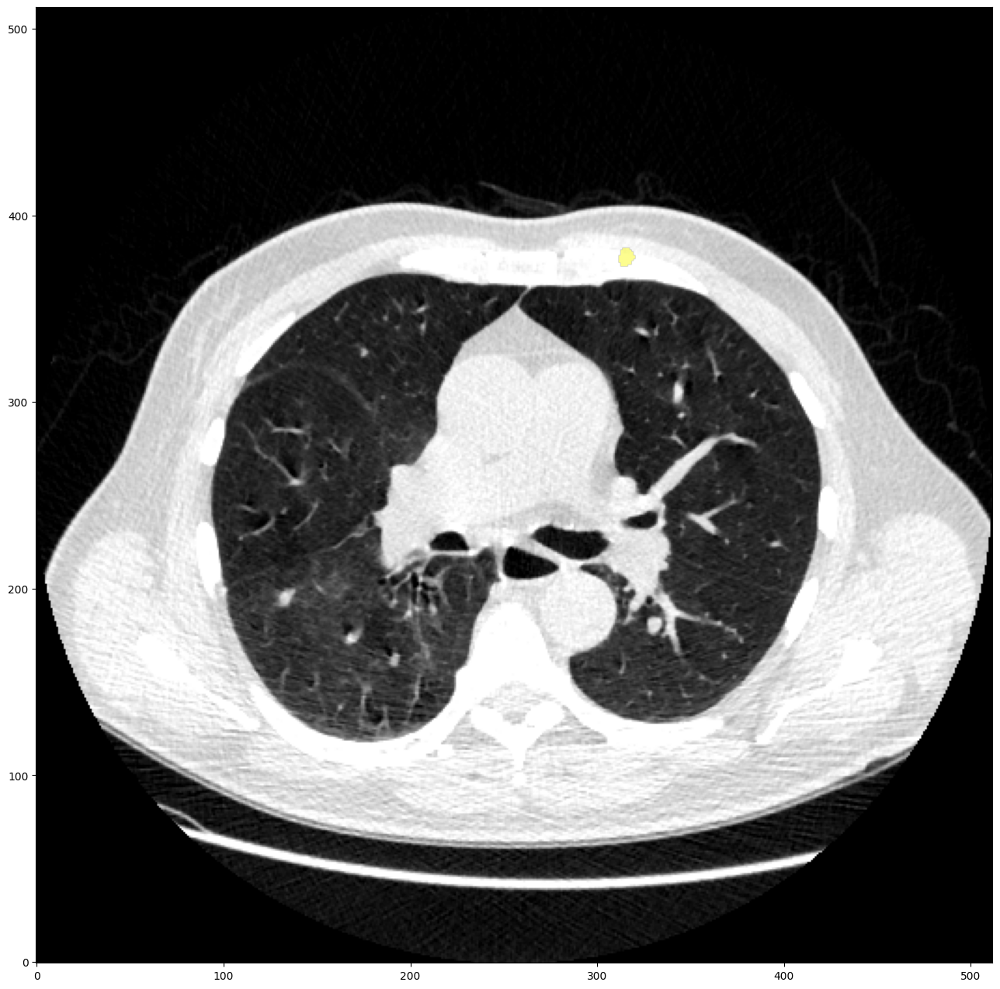

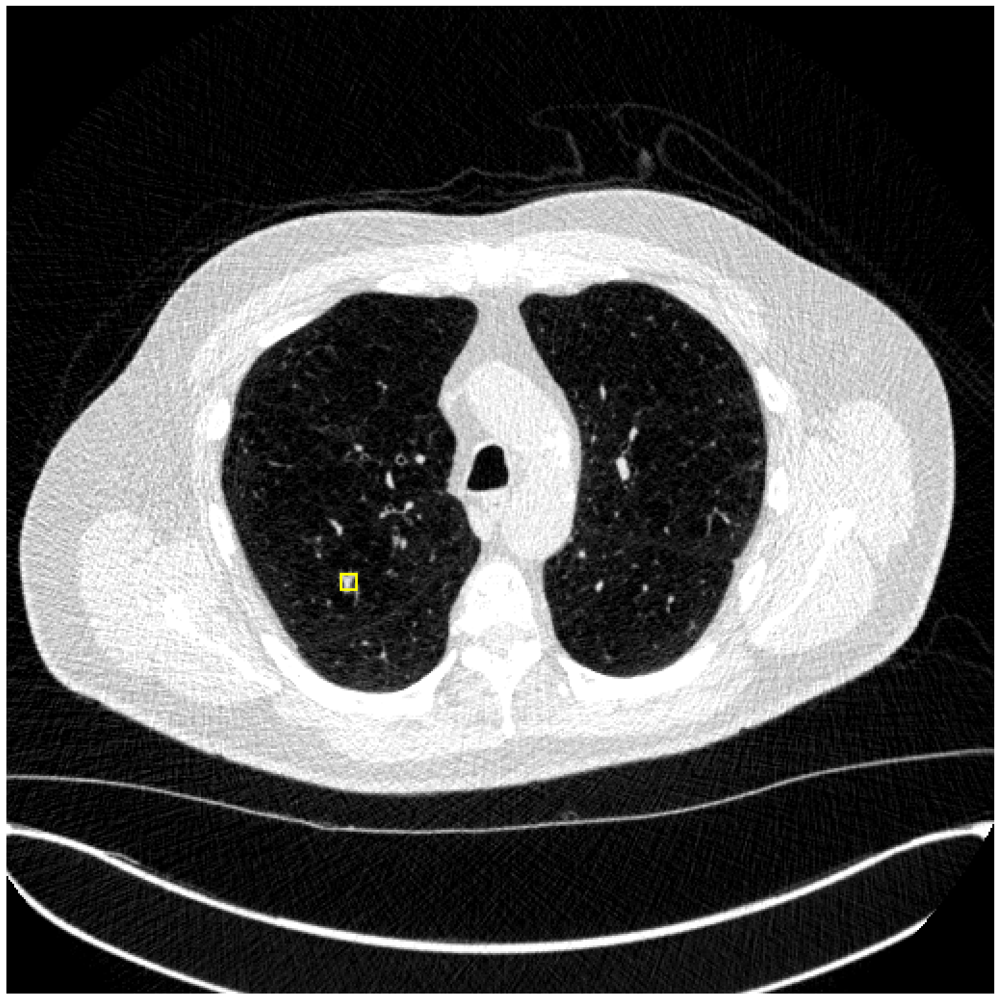

-----------------------------------------------------------------------------------------------


(629, 512, 512)


/content/MedSAM2/sam2/sam2_video_predictor_npz.py:965: UserWarning: /content/MedSAM2/sam2/_C.so: undefined symbol: _ZN3c106detail23torchInternalAssertFailEPKcS2_jS2_RKNSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEEE

Skipping the post-processing step due to the error above. You can still use SAM 2 and it's OK to ignore the error above, although some post-processing functionality may be limited (which doesn't affect the results in most cases; see https://github.com/facebookresearch/sam2/blob/main/INSTALL.md).
  pred_masks_gpu = fill_holes_in_mask_scores(
propagate in video: 100%|██████████| 629/629 [00:20<00:00, 31.38it/s]
propagate in video: 0it [00:00, ?it/s]



DLCS_1418_01
DLCS_1418_01_mask.nii.gz
-----------------------------------------------------------------------------------------------
Annotation-ID =DLCS_1418_02
WorlCoord  CCC (x,y,x) =[ -72.24414062 -114.92871094 -116.83123779]
VoxelCoord CCC (x,y,y) =(160, 172, 330)
WorldCoord (w,h,d) =[3.69140625 3.77929688 3.4375    ]
VoxelCoord (w,h,d) =[4, 4, 5]


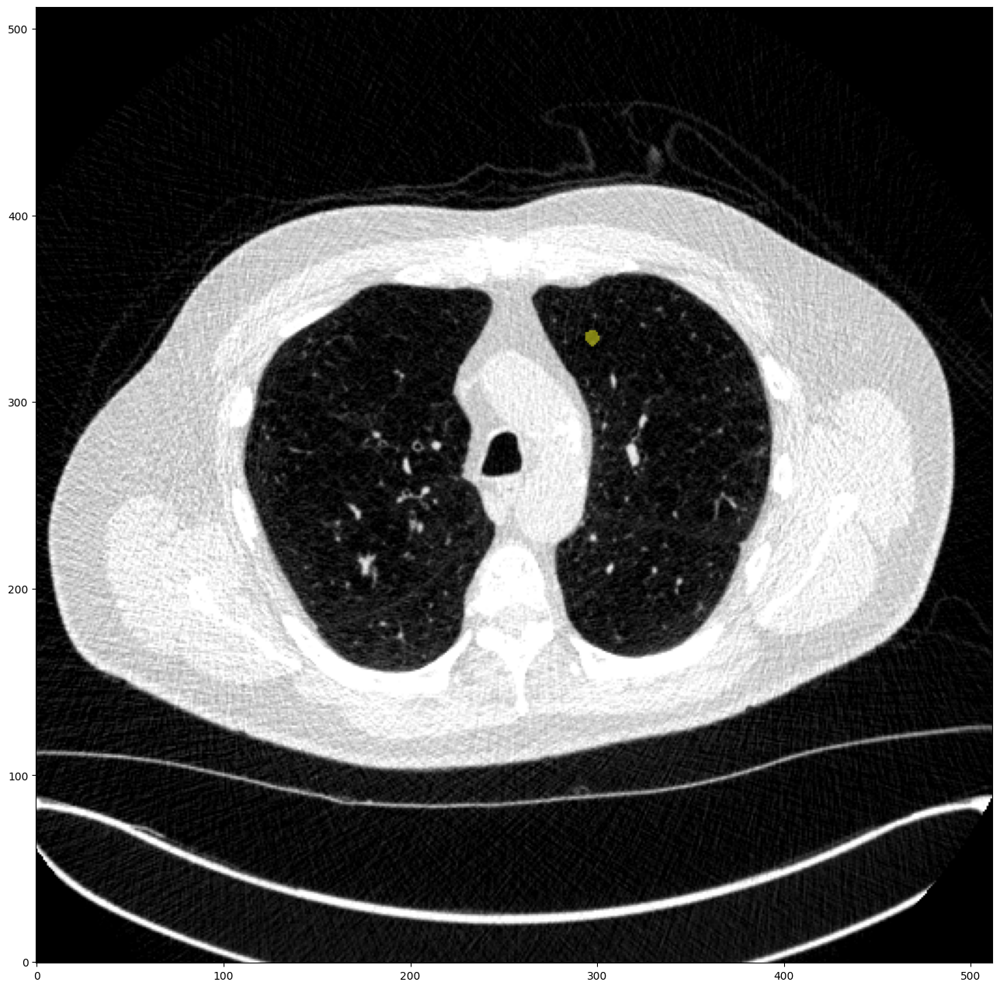

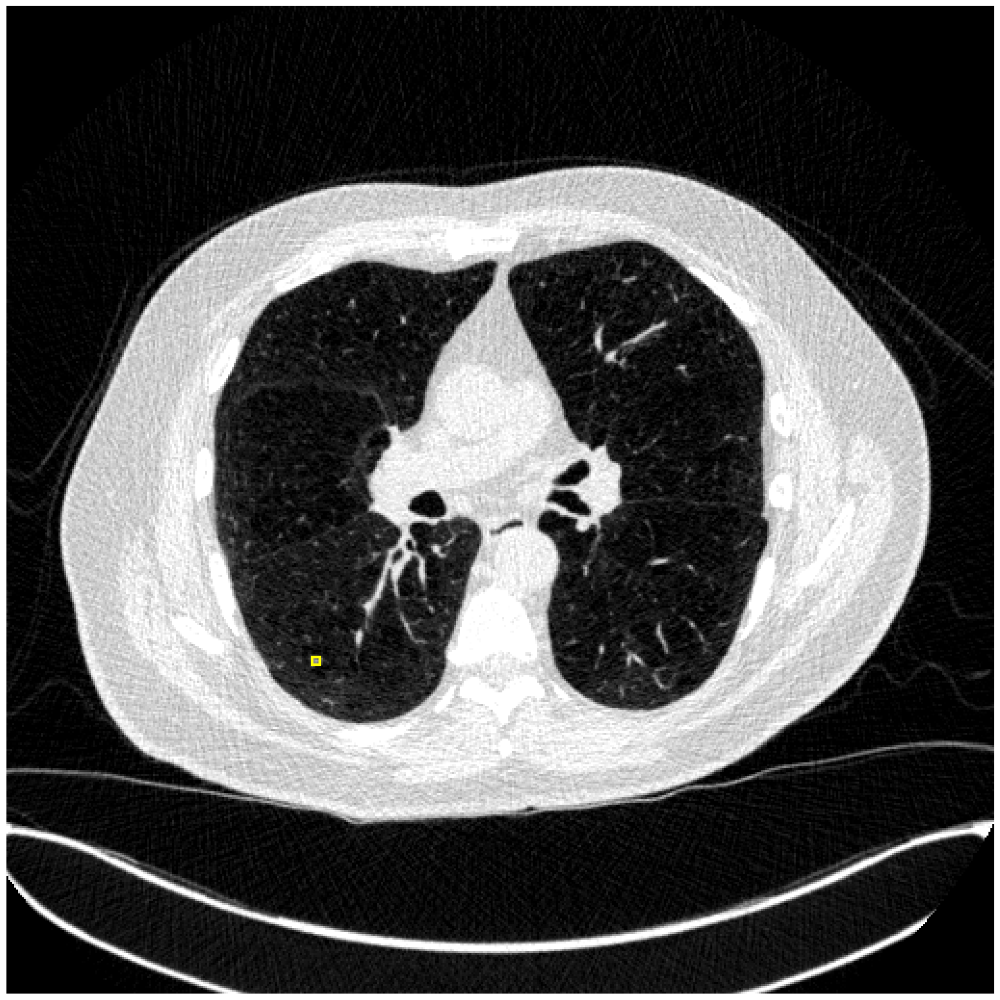

-----------------------------------------------------------------------------------------------


(629, 512, 512)


propagate in video: 100%|██████████| 629/629 [00:20<00:00, 31.34it/s]
propagate in video: 0it [00:00, ?it/s]



DLCS_1418_02
DLCS_1418_02_mask.nii.gz
|------------------------------ No=4 ------------------------------|


Loading the Image:DLCS_1419.nii.gz
Number of Annotation:2
-----------------------------------------------------------------------------------------------
Annotation-ID =DLCS_1419_01
WorlCoord  CCC (x,y,x) =[ 82.52929688  37.83691406 -75.546875  ]
VoxelCoord CCC (x,y,y) =(373, 201, 423)
WorldCoord (w,h,d) =[4.21875    4.13085938 3.90625   ]
VoxelCoord (w,h,d) =[6, 5, 6]


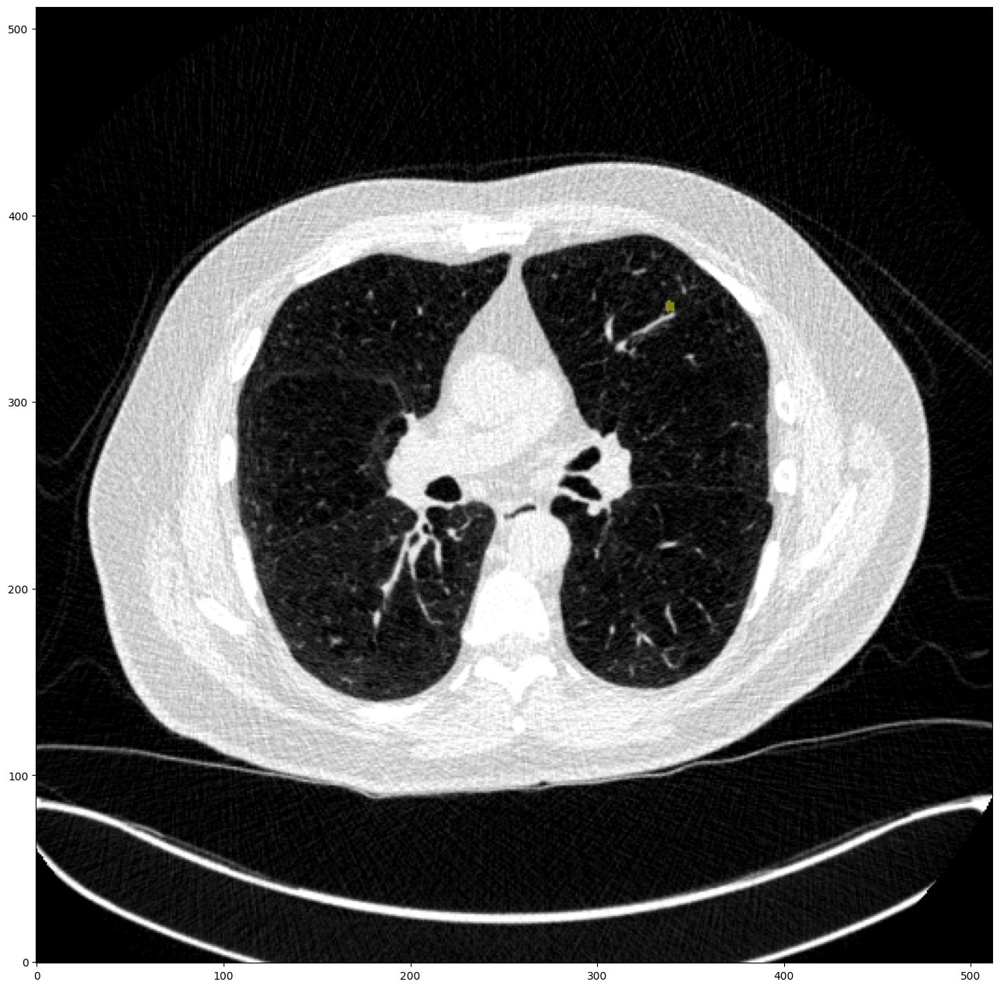

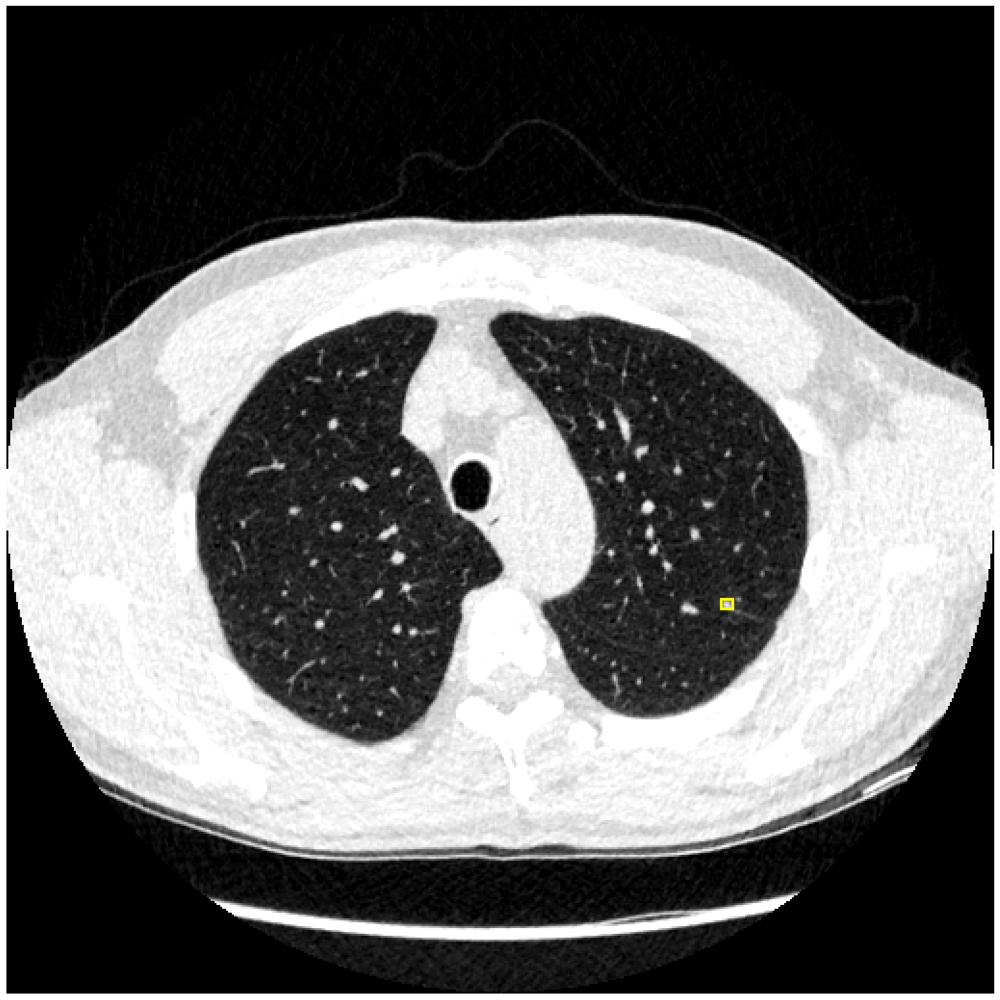

-----------------------------------------------------------------------------------------------


(545, 512, 512)


/content/MedSAM2/sam2/sam2_video_predictor_npz.py:965: UserWarning: /content/MedSAM2/sam2/_C.so: undefined symbol: _ZN3c106detail23torchInternalAssertFailEPKcS2_jS2_RKNSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEEE

Skipping the post-processing step due to the error above. You can still use SAM 2 and it's OK to ignore the error above, although some post-processing functionality may be limited (which doesn't affect the results in most cases; see https://github.com/facebookresearch/sam2/blob/main/INSTALL.md).
  pred_masks_gpu = fill_holes_in_mask_scores(
propagate in video: 100%|██████████| 545/545 [00:17<00:00, 31.39it/s]
propagate in video: 0it [00:00, ?it/s]



DLCS_1419_01
DLCS_1419_01_mask.nii.gz
-----------------------------------------------------------------------------------------------
Annotation-ID =DLCS_1419_02
WorlCoord  CCC (x,y,x) =[-120.49804688    9.36035156 -163.359375  ]
VoxelCoord CCC (x,y,y) =(85, 242, 283)
WorldCoord (w,h,d) =[6.50390625 6.41601562 6.40625   ]
VoxelCoord (w,h,d) =[9, 9, 10]


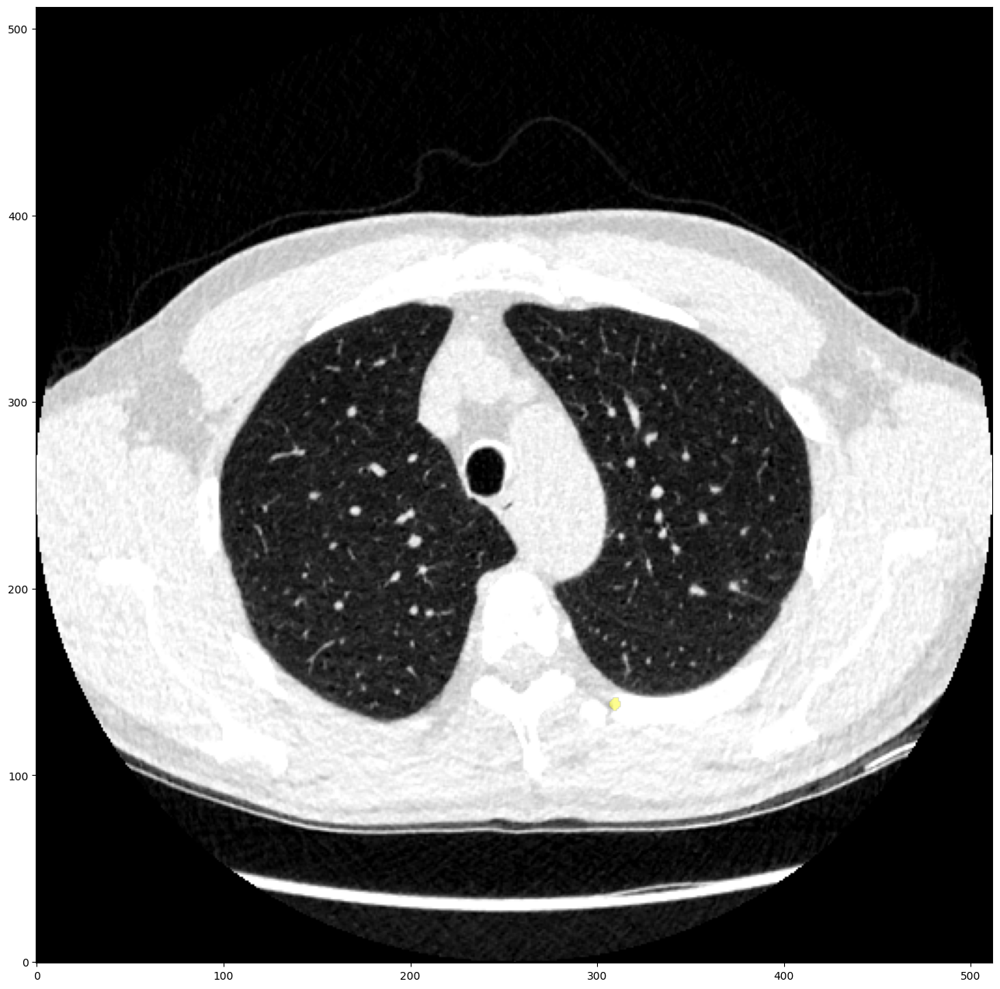

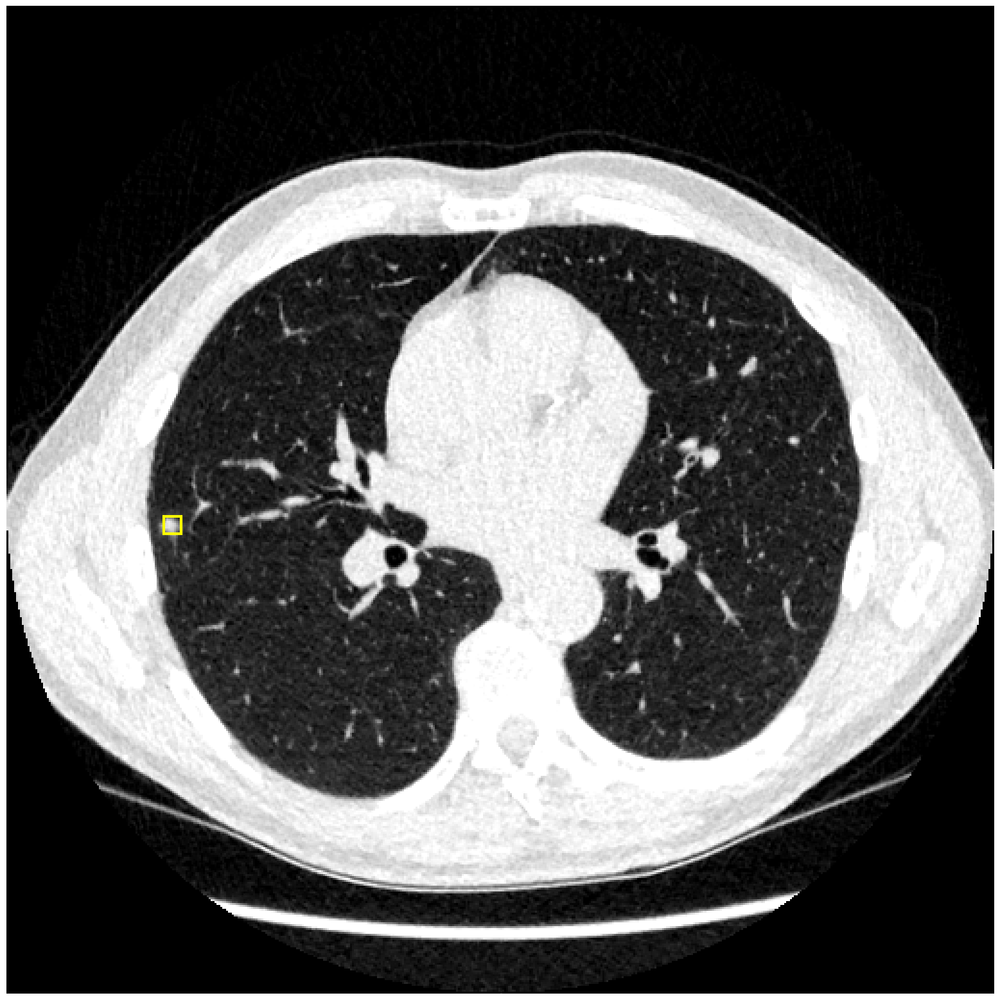

-----------------------------------------------------------------------------------------------


(545, 512, 512)


propagate in video: 100%|██████████| 545/545 [00:17<00:00, 31.45it/s]
propagate in video: 0it [00:00, ?it/s]



DLCS_1419_02
DLCS_1419_02_mask.nii.gz
|------------------------------ No=5 ------------------------------|


Loading the Image:DLCS_1420.nii.gz
Number of Annotation:3
-----------------------------------------------------------------------------------------------
Annotation-ID =DLCS_1420_01
WorlCoord  CCC (x,y,x) =[ -70.75195312   62.53417969 -217.5390625 ]
VoxelCoord CCC (x,y,y) =(155, 166, 212)
WorldCoord (w,h,d) =[10.01953125 10.10742188  9.921875  ]
VoxelCoord (w,h,d) =[14, 14, 15]


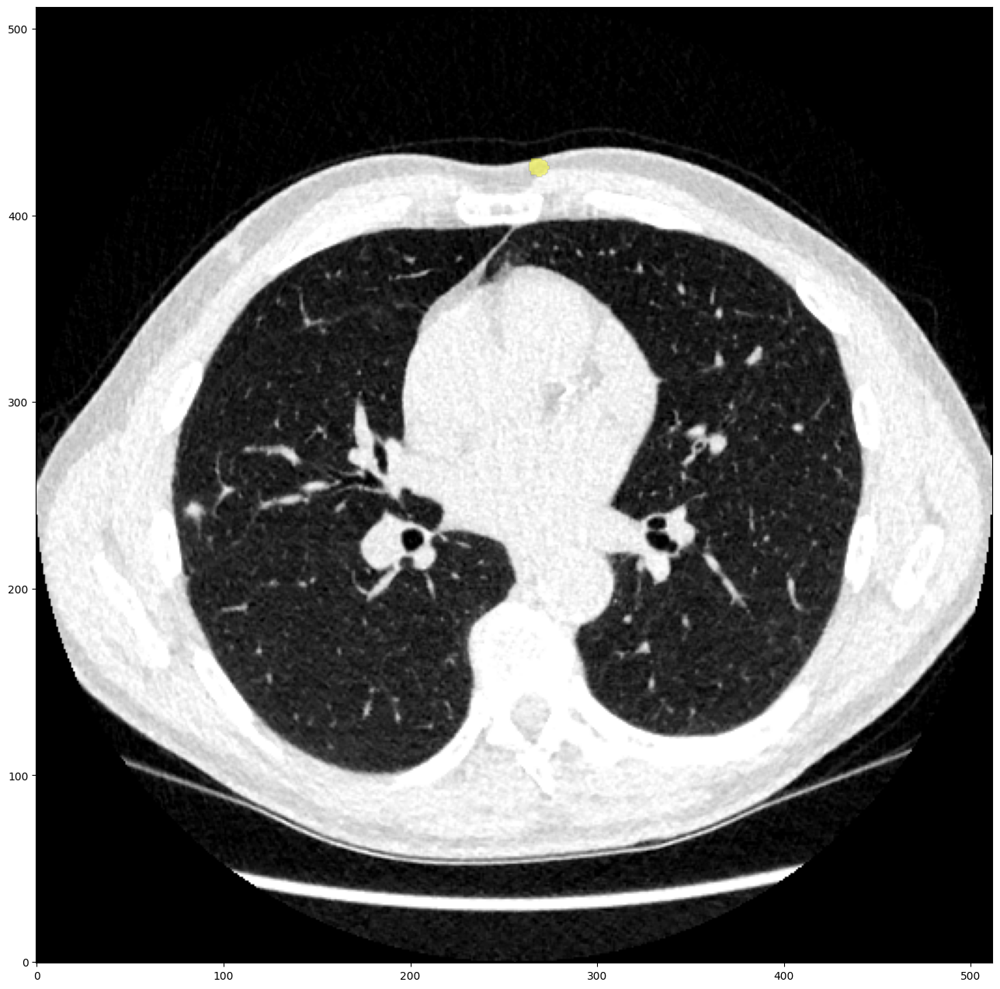

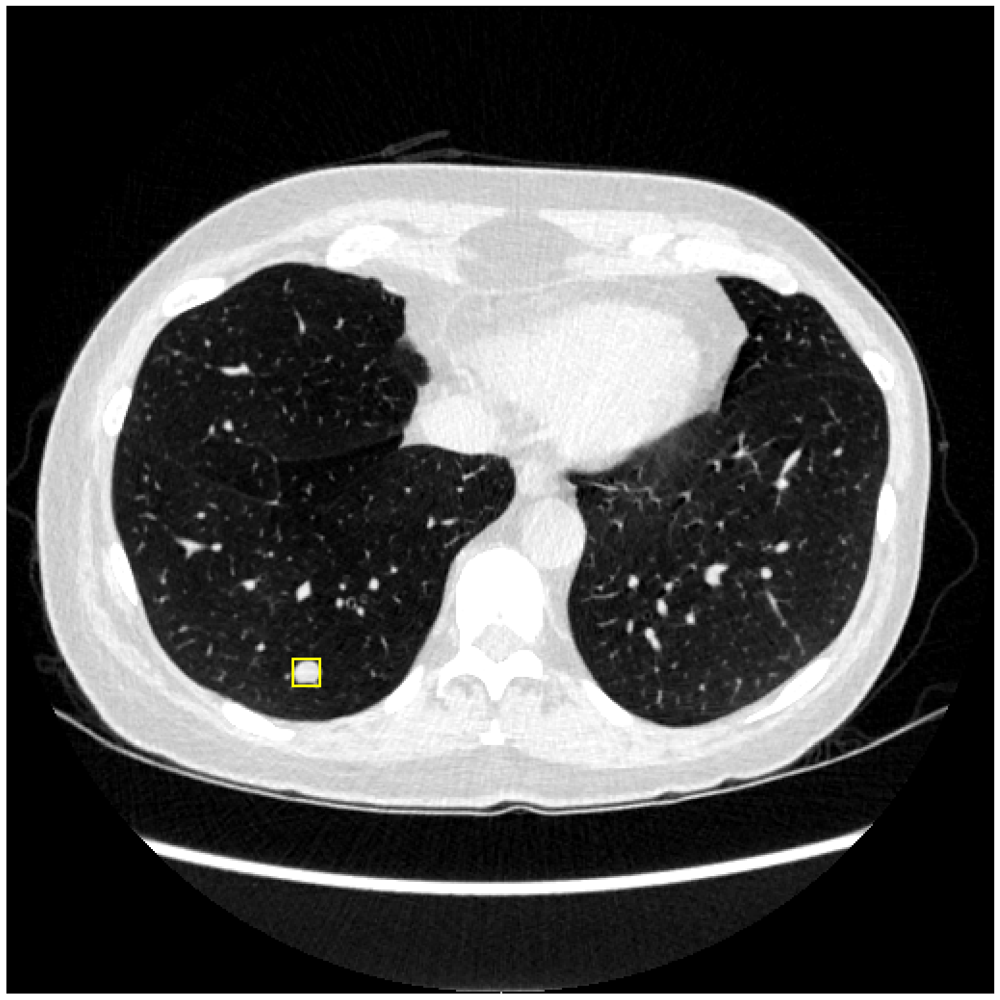

-----------------------------------------------------------------------------------------------


(617, 512, 512)


/content/MedSAM2/sam2/sam2_video_predictor_npz.py:965: UserWarning: /content/MedSAM2/sam2/_C.so: undefined symbol: _ZN3c106detail23torchInternalAssertFailEPKcS2_jS2_RKNSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEEE

Skipping the post-processing step due to the error above. You can still use SAM 2 and it's OK to ignore the error above, although some post-processing functionality may be limited (which doesn't affect the results in most cases; see https://github.com/facebookresearch/sam2/blob/main/INSTALL.md).
  pred_masks_gpu = fill_holes_in_mask_scores(
propagate in video: 100%|██████████| 617/617 [00:20<00:00, 30.62it/s]
propagate in video: 0it [00:00, ?it/s]



DLCS_1420_01
DLCS_1420_01_mask.nii.gz
-----------------------------------------------------------------------------------------------
Annotation-ID =DLCS_1420_02
WorlCoord  CCC (x,y,x) =[ -97.20703125  -38.84765625 -100.390625  ]
VoxelCoord CCC (x,y,y) =(118, 310, 399)
WorldCoord (w,h,d) =[4.21875 4.21875 3.90625]
VoxelCoord (w,h,d) =[6, 6, 6]


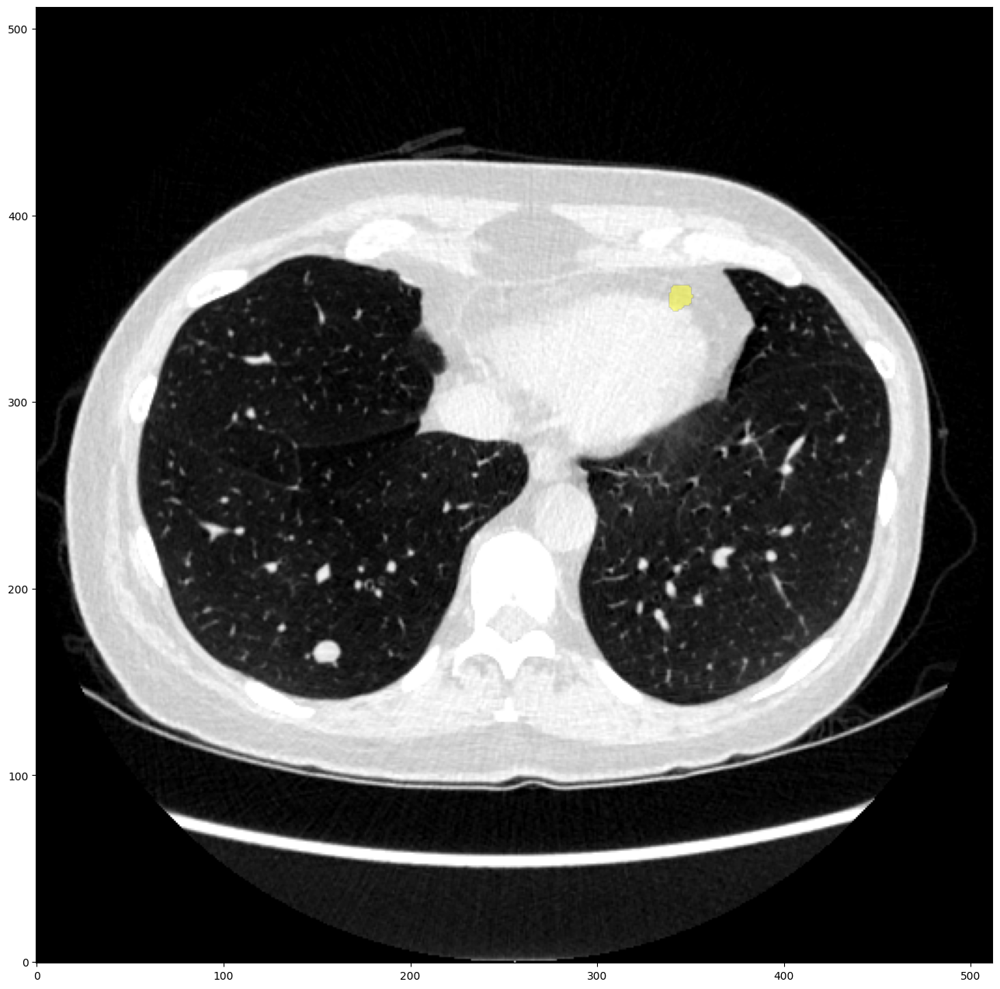

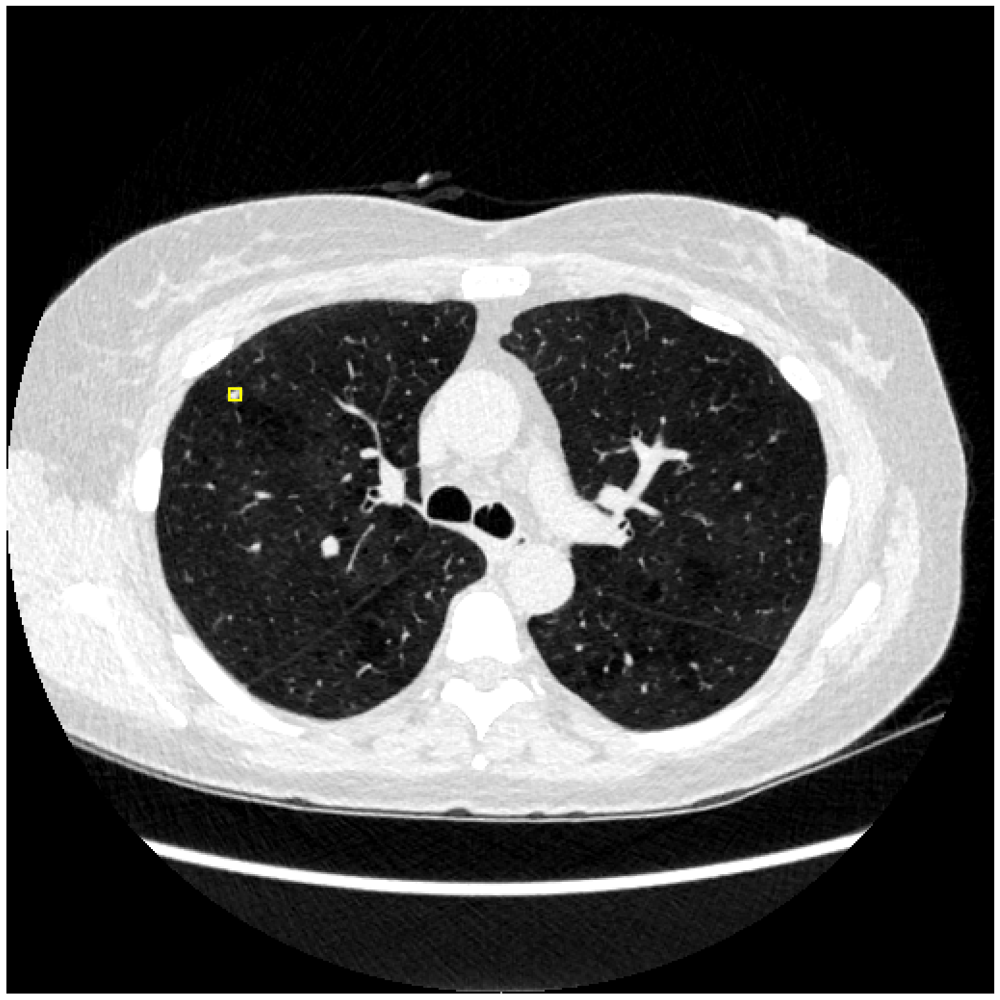

-----------------------------------------------------------------------------------------------


(617, 512, 512)


propagate in video: 100%|██████████| 617/617 [00:19<00:00, 31.51it/s]
propagate in video: 0it [00:00, ?it/s]



DLCS_1420_02
DLCS_1420_02_mask.nii.gz
-----------------------------------------------------------------------------------------------
Annotation-ID =DLCS_1420_03
WorlCoord  CCC (x,y,x) =[  71.49902344  -62.578125   -109.765625  ]
VoxelCoord CCC (x,y,y) =(358, 344, 384)
WorldCoord (w,h,d) =[4.13085938 4.21875    3.90625   ]
VoxelCoord (w,h,d) =[5, 6, 6]


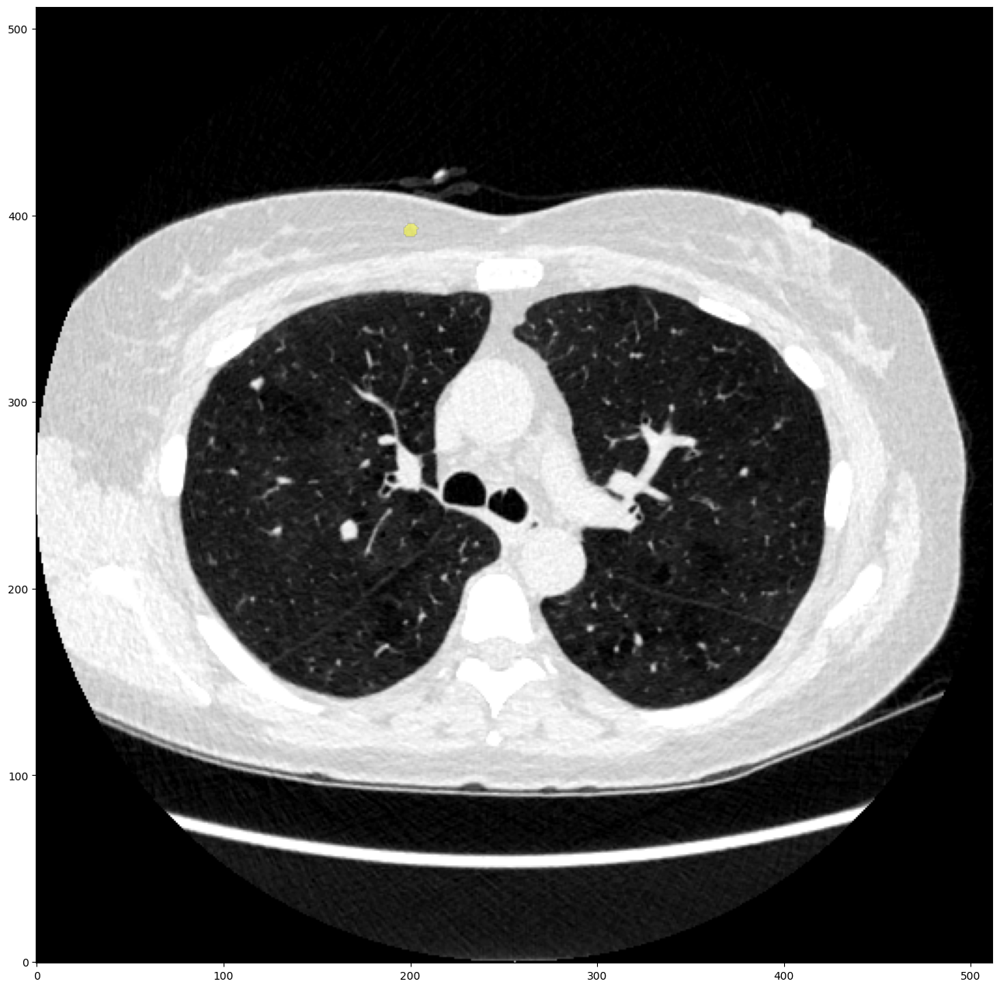

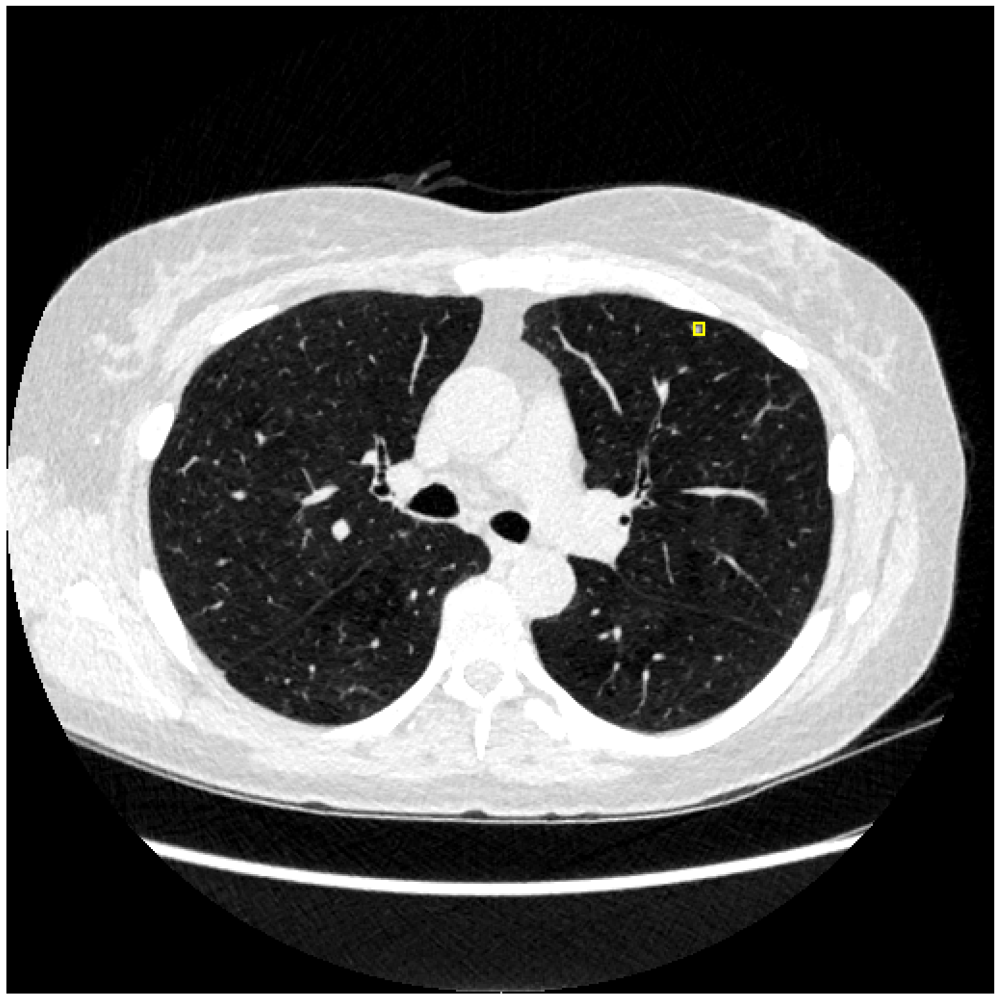

-----------------------------------------------------------------------------------------------


(617, 512, 512)


propagate in video: 100%|██████████| 617/617 [00:19<00:00, 31.57it/s]
propagate in video: 0it [00:00, ?it/s]



DLCS_1420_03
DLCS_1420_03_mask.nii.gz


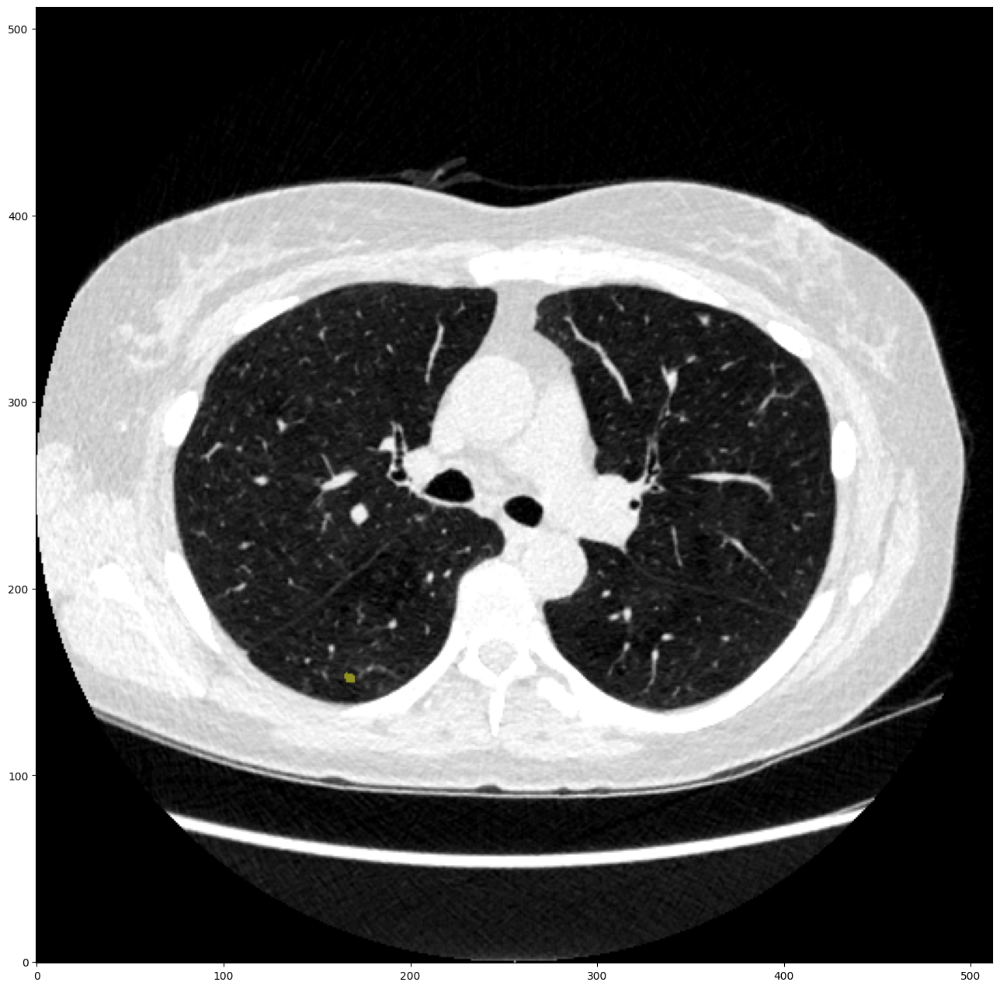

In [27]:
def make_bold(text):
    return f"\033[1m{text}\033[0m"



#-| this function load an image using simpleITK and return
#-|3D array, origin_numpy and spacing numpy
def load_itk_image(filename):
    '''
    this function load an image using simpleITK and return
    3D array, origin_numpy and spacing numpy
    input:  filename     = nifty CT image path eg."./CT_CTGRAV_TMP404180_4.nii.gz"
    output: numpyImage   = 3D CT numpy as slice X height x Width (z,y,x)
            numpyOrigin  = (z_origin,  y_origin,  x_origin)
            numpySpacing = (z_Spacing, y_Spacing, x_Spacing)
    '''
    itkimage = sitk.ReadImage(filename)           # load the ct image
    numpyImage = sitk.GetArrayFromImage(itkimage) # give CT to 3D numpy (z,y,x)

    #- When we load get the  itkimage.GetOrigin/GetSpacing it
    # returns the array in order (x_origin, y_origin,z_origin)
    # as we loaded the CT image as 3D numpy (z,y,x) that is why
    # we also reversed the acquired spacing and origin
    numpyOrigin  = itkimage.GetOrigin()   # 3D numpy (x_origin,  y_origin,  z_origin)
    numpySpacing = itkimage.GetSpacing() # 3D numpy (z_Spacing, y_Spacing, x_Spacing)
    return numpyImage, numpyOrigin, numpySpacing





#-- Normalizing image for better visualization

def normalize_image_to_uint8(image, lower_bound=-1000, upper_bound=100):
    """
    Clip the image to the lung window, then normalize it to uint8.
    Args:
        image: numpy array
        lower_bound: lower HU bound for the lung window (default: -1500 HU)
        upper_bound: upper HU bound for the lung window (default: -500 HU)
    """
    # Clip to lung window
    clipped_img = np.clip(image, lower_bound, upper_bound)

    # Normalize to [0, 255]
    normalized_img = ((clipped_img - lower_bound) / (upper_bound - lower_bound)) * 255.0
    normalized_img = normalized_img.astype(np.uint8)
    return normalized_img




from google.colab import drive
drive.mount('/content/drive')
raw_data_path = '/content/drive/My Drive/DLCS/DLCS dataset/'
dataset_csv   = '/content/drive/My Drive/DLCS/DLCSD24_Annotations.csv'
df             = pd.read_csv(dataset_csv)



# returns JSON object as
# a dictionary
Final_dect = df[(df['benchmark_split']=='test')]['ct_nifti_file'].unique()


predictor = build_sam2_video_predictor_npz(model_cfg, checkpoint)

for dictonary_list_i in range(0,5):#len(Final_dect)):
    #print('|------------------------ No={} ---------------------|'.format(dictonary_list_i))
    print(make_bold('|' + '-'*30 + ' No={} '.format(dictonary_list_i+1) + '-'*30 + '|'))
    print('\n')

    desired_value      = Final_dect[dictonary_list_i]        # Replace with the value you want
    filtered_df        = df[df['ct_nifti_file'] == desired_value]
    example_dictionary = filtered_df.reset_index()


    # load image
    print('Loading the Image:{}'.format(example_dictionary['ct_nifti_file'][0]))
    print('Number of Annotation:{}'.format(len(example_dictionary)))
    ct_nifti_path = raw_data_path+example_dictionary['ct_nifti_file'][0]
    sitk_img      = sitk.ReadImage(ct_nifti_path)
    sitk_numpy    = sitk.GetArrayFromImage(sitk_img)



    for Which_box_to_use in range(0,len(example_dictionary)):
        print('-----------------------------------------------------------------------------------------------')
        print('Annotation-ID ={}'.format(example_dictionary["nodule_id"][Which_box_to_use]))
        worldCoord = np.asarray([float(example_dictionary["coordX"][Which_box_to_use]),float(example_dictionary["coordY"][Which_box_to_use]),float(example_dictionary["coordZ"][Which_box_to_use])])
        voxelCoord = sitk_img.TransformPhysicalPointToIndex(worldCoord)
        print('WorlCoord  CCC (x,y,x) ={}'.format(worldCoord))
        print('VoxelCoord CCC (x,y,y) ={}'.format(voxelCoord))

        whd_worldCoord  = np.asarray([float(example_dictionary["w"][Which_box_to_use]),float(example_dictionary["h"][Which_box_to_use]),float(example_dictionary["d"][Which_box_to_use])])
        spacing         = sitk_img.GetSpacing()
        w               = int(whd_worldCoord[0] / spacing[0])
        h               = int(whd_worldCoord[1] / spacing[1])
        d               = int(whd_worldCoord[2] / spacing[2])
        whd_voxelCoord  = [w,h,d]
        print('WorldCoord (w,h,d) ={}'.format(whd_worldCoord))
        print('VoxelCoord (w,h,d) ={}'.format(whd_voxelCoord))


        plt.figure(figsize=(16,16))
        ct_numpy_imag = normalize_image_to_uint8(sitk_numpy[voxelCoord[2],:,:], lower_bound=-1000, upper_bound=100)
        plt.imshow(ct_numpy_imag,cmap='gray',origin='lower')
        plt.tight_layout()
        plt.axis('off')


        start_x  = int(voxelCoord[0] - int(w//2))
        start_y  = int(voxelCoord[1] - int(h//2))

        rect = plt.Rectangle((start_x, start_y), w, h, fill=False, color='yellow', linewidth=3)
        plt.gca().add_patch(rect)
        plt.show()

        print('-----------------------------------------------------------------------------------------------')
        print('\n')

        nii_image_data = sitk.GetArrayFromImage(sitk_img)
        segs_3D = np.zeros(nii_image_data.shape, dtype=np.uint8)
        print(segs_3D.shape)
        nii_image_data_pre = np.clip(nii_image_data, -1000, 100)
        nii_image_data_pre = (nii_image_data_pre - np.min(nii_image_data_pre))/(np.max(nii_image_data_pre)-np.min(nii_image_data_pre))*255.0
        nii_image_data_pre = np.uint8(nii_image_data_pre)
        img_resized = resize_grayscale_to_rgb_and_resize(nii_image_data_pre, 512)
        img_resized = img_resized / 255.0
        img_resized = torch.from_numpy(img_resized)
        img_mean=(0.485, 0.456, 0.406)
        img_std=(0.229, 0.224, 0.225)
        img_mean = torch.tensor(img_mean, dtype=torch.float32)[:, None, None]
        img_std = torch.tensor(img_std, dtype=torch.float32)[:, None, None]
        img_resized -= img_mean
        img_resized /= img_std

        key_slice_img = nii_image_data_pre[0, :,:]
        video_height = key_slice_img.shape[0]
        video_width = key_slice_img.shape[1]

        min_x, min_y = start_x, start_y
        max_x, max_y = start_x + w, start_y + h
        bbox = [min_x, min_y, max_x, max_y]

        with torch.inference_mode(), torch.autocast("cuda", dtype=torch.bfloat16):
          inference_state = predictor.init_state(img_resized, video_height, video_width)

          _, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
                                              inference_state=inference_state,
                                              frame_idx=0,
                                              obj_id=1,
                                              box=bbox,
                                              )


          for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
              segs_3D[out_frame_idx, (out_mask_logits[0] > 0.0).cpu().numpy()[0]] = 1
          predictor.reset_state(inference_state)

          _, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
                                              inference_state=inference_state,
                                              frame_idx=0,
                                              obj_id=1,
                                              box=bbox,
                                          )


          for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state, reverse=True):
              segs_3D[out_frame_idx, (out_mask_logits[0] > 0.0).cpu().numpy()[0]] = 1
          predictor.reset_state(inference_state)
        if np.max(segs_3D) > 0:
            segs_3D = getLargestCC(segs_3D)
            segs_3D = np.uint8(segs_3D)
        sitk_image = sitk.GetImageFromArray(nii_image_data_pre)
        sitk_image.CopyInformation(sitk_img)
        sitk_mask = sitk.GetImageFromArray(segs_3D)
        sitk_mask.CopyInformation(sitk_img)

        plt.figure(figsize=(16,16))
        imgs_2D = nii_image_data_pre[0].T
        imgs_2D = imgs_2D[:, :, None].repeat(3, axis=-1)
        segs_2D_slice = segs_3D[0].T
        plt.imshow(imgs_2D, origin="upper")
        #plt.imshow(imgs_2D, origin="lower")
        #plt.imshow(ct_numpy_imag,cmap='gray')
        #plt.gca().set_ylim(plt.gca().get_ylim()[::-1])
        #segs_2D_slice_corrected = np.rot90(segs_2D_slice, k=-1)
        #segs_2D_slice = np.rot90(segs_2D_slice_corrected, k=-1)
        show_mask(segs_2D_slice, ax=plt.gca())
        print()

        nii_fname = example_dictionary["nodule_id"][Which_box_to_use]
        nii = example_dictionary["ct_nifti_file"][Which_box_to_use]
        print(nii_fname)
        save_seg_name = nii_fname + f'_mask.nii.gz'
        print(save_seg_name)
        sitk.WriteImage(sitk_image, os.path.join(pred_save_dir, nii.replace('.nii.gz', '_img.nii.gz')))
        sitk.WriteImage(sitk_mask, os.path.join(pred_save_dir, save_seg_name))
        seg_info['nii_name'].append(save_seg_name)

In [28]:
# save the segmentation info to a csv file
seg_info_df = pd.DataFrame(seg_info)
seg_info_df.to_csv(join(pred_save_dir, 'tiny_seg_info202412.csv'), index=False)

In [40]:
import SimpleITK as sitk
import matplotlib.pyplot as plt
import numpy as np
import os
import glob
import re
import matplotlib.cm as cm
from matplotlib.patches import Patch

def process_dlcs_images(dlcs_folder, slice_idx=None, save_output=False, output_folder=None):
    """
    Process DLCS images and overlay their corresponding masks.

    Args:
        dlcs_folder: Path to folder containing DLCS images and masks
        slice_idx: Slice index to display (if None, uses middle slice)
        save_output: Whether to save the overlay images
        output_folder: Where to save output images (if save_output=True)
    """

    # Find all original DLCS images
    image_pattern = os.path.join(dlcs_folder, "DLCS_*.nii.gz")
    image_files = glob.glob(image_pattern)

    # Filter out mask files from the image list
    image_files = [f for f in image_files if "_mask.nii.gz" not in f]
    image_files.sort()

    print(f"Found {len(image_files)} DLCS images")

    # Process each image
    for image_file in image_files:
        # Extract the base name and number
        base_name = os.path.basename(image_file)
        match = re.match(r'DLCS_(\d{4})\.nii\.gz', base_name)

        if not match:
            continue

        image_number = match.group(1)
        print(f"\nProcessing DLCS_{image_number}...")

        # Find all corresponding mask files
        mask_pattern = os.path.join(dlcs_folder, f"DLCS_{image_number}_*_mask.nii.gz")
        mask_files = glob.glob(mask_pattern)
        mask_files.sort()

        if not mask_files:
            print(f"  No masks found for DLCS_{image_number}")
            continue

        print(f"  Found {len(mask_files)} masks")

        # Load the original image
        try:
            image = sitk.ReadImage(image_file)
            img_array = sitk.GetArrayFromImage(image)

            # Use middle slice if slice_idx not specified
            if slice_idx is None:
                current_slice_idx = img_array.shape[0] // 2
            else:
                current_slice_idx = min(slice_idx, img_array.shape[0] - 1)

            img_slice = img_array[current_slice_idx]

            # Normalize image for display
            img_slice = (img_slice - img_slice.min()) / (img_slice.max() - img_slice.min())

            # Create RGB image
            img_rgb = np.stack([img_slice, img_slice, img_slice], axis=-1)

            # Generate colors for masks
            num_masks = len(mask_files)
            if num_masks == 1:
                colors = [[1, 0, 0]]  # Red for single mask
            else:
                colors = cm.tab10(np.linspace(0, 1, num_masks))[:, :3]

            # Load and overlay each mask
            legend_elements = []
            mask_found = False

            for i, mask_file in enumerate(mask_files):
                try:
                    # Extract mask number from filename
                    mask_match = re.search(r'DLCS_\d{4}_(\d{2})_mask\.nii\.gz', os.path.basename(mask_file))
                    mask_num = mask_match.group(1) if mask_match else str(i+1)

                    # Load mask
                    mask = sitk.ReadImage(mask_file)
                    mask_array = sitk.GetArrayFromImage(mask)
                    mask_slice = mask_array[current_slice_idx]

                    # Check if mask has any pixels in this slice
                    if np.any(mask_slice > 0):
                        img_rgb[mask_slice > 0] = colors[i]
                        legend_elements.append(Patch(facecolor=colors[i], label=f'Nodule {mask_num}'))
                        mask_found = True
                        print(f"    Applied mask {mask_num}")
                    else:
                        print(f"    Mask {mask_num} empty in slice {current_slice_idx}")

                except Exception as e:
                    print(f"    Error loading mask {mask_file}: {e}")

            # Create the plot
            plt.figure(figsize=(12, 8))
            plt.imshow(img_rgb, origin='lower')  # Use origin='lower' for medical images

            if legend_elements:
                plt.legend(handles=legend_elements, loc='upper right', bbox_to_anchor=(1, 1))

            plt.title(f'DLCS_{image_number} - Slice {current_slice_idx} ({len(mask_files)} masks)')
            plt.axis('off')

            # Save or show
            if save_output and output_folder:
                os.makedirs(output_folder, exist_ok=True)
                output_path = os.path.join(output_folder, f'DLCS_{image_number}_overlay.png')
                plt.savefig(output_path, dpi=150, bbox_inches='tight')
                print(f"  Saved: {output_path}")

            plt.show()

        except Exception as e:
            print(f"  Error processing DLCS_{image_number}: {e}")

# Example usage
if __name__ == "__main__":
    # Set your paths
    dlcs_folder = "/content/drive/MyDrive/DLCS/DLCS dataset/"  # Update this path
    masks_folder = "/content/drive/MyDrive/DLCS/MedSAM_results/"

    # Process all images (uncomment one of these options)

    # Option 1: Process all images, display middle slice
    # process_dlcs_images(dlcs_folder)

    # Option 2: Process all images, display specific slice
    # process_dlcs_images(dlcs_folder, slice_idx=50)

    # Option 3: Process and save outputs
    # process_dlcs_images(dlcs_folder, save_output=True, output_folder="/path/to/output")

    # Option 4: Process just a few images for testing
    def process_subset(dlcs_folder, start_num=1, end_num=5):
        """Process just a subset of images for testing"""
        for i in range(start_num, end_num + 1):
            image_file = os.path.join(dlcs_folder, f"DLCS_\d{4}.nii.gz")
            if os.path.exists(image_file):
                # Find corresponding masks
                mask_pattern = os.path.join(masks_folder, f"DLCS_\d{4}_*_mask.nii.gz")
                mask_files = glob.glob(mask_pattern)

                if mask_files:
                    print(f"\nProcessing DLCS_{i:04d} with {len(mask_files)} masks...")

                    # Load image
                    image = sitk.ReadImage(image_file)
                    img_array = sitk.GetArrayFromImage(image)
                    img_slice = img_array[img_array.shape[0] // 2]  # Middle slice
                    img_slice = (img_slice - img_slice.min()) / (img_slice.max() - img_slice.min())
                    img_rgb = np.stack([img_slice, img_slice, img_slice], axis=-1)

                    # Generate colors and overlay masks
                    colors = cm.tab10(np.linspace(0, 1, len(mask_files)))[:, :3]
                    legend_elements = []

                    for j, mask_file in enumerate(sorted(mask_files)):
                        mask = sitk.ReadImage(mask_file)
                        mask_array = sitk.GetArrayFromImage(mask)
                        mask_slice = mask_array[img_array.shape[0] // 2]

                        if np.any(mask_slice > 0):
                            img_rgb[mask_slice > 0] = colors[j]
                            mask_num = re.search(r'(\d{2})_mask', os.path.basename(mask_file)).group(1)
                            legend_elements.append(Patch(facecolor=colors[j], label=f'Nodule {mask_num}'))

                    # Plot
                    plt.figure(figsize=(12, 8))
                    plt.imshow(img_rgb, origin='lower')
                    if legend_elements:
                        plt.legend(handles=legend_elements, loc='upper right')
                    plt.title(f'DLCS_\d{4} - {len(mask_files)} masks')
                    plt.axis('off')
                    plt.show()

    # Uncomment to test with first 5 images:
        process_subset(dlcs_folder, 1, 5)